# Libraries

In [1]:
# Import libraries
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import libpysal
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import mapclassify
import contextily as cx
import plotly.express as px
import rasterio
from rasterio.plot import show as rioshow
from geopandas import GeoDataFrame
from shapely.geometry import Point
from contextily import Place
import esda
%matplotlib inline

### Paths

In [2]:
parcel_file_csv = "/Users/aslimutlu/Desktop/RHEA_Dutch/Data/Parcel_chars_Maastricht.csv"  # Specify parcel characteristics file used when running the model
parcel_file_shp = "/Users/aslimutlu/Desktop/RHEA_Dutch/Data/Parcel_chars_Maastricht.shp"
results_path = "/Users/aslimutlu/Desktop/RHEA_Dutch/Results/"  # Change this for different output files

### Buyers, sellers, transactions

In [3]:
df_list = []

i = 0
for file in os.listdir(results_path):
    if file.startswith("model") and file.endswith("pkl"):
        model_df = pd.read_pickle(results_path + file)
        model_df["Step"] = model_df.index
        model_df["Run"] = int(file.split("seed")[1].split("]")[0]) #int(file.split("]")[0][-1])
        df_list.append(model_df)
        i += 1

model_df = pd.concat(df_list)
model_df["Year"] = 0.5 * model_df["Step"]
model_df

,Households,N_sellers,N_buyers,Sold properties,Successful sellers,Successful buyers,P_ask,P_bid,P_trans,Trans history,Regression coefs,Step,Run,Year
0,5957,0,0,[],[],[],[],[],[],0,"[12.22396, 0.00587, -0.00406, 2e-05, 0.00677, ...",0,2,0.0
1,6305,571,348,"[68927.0, 6305996.0, 1834169.0, 813605.0, 5658...","[1194, 1207, 1274, 1325, 1373, 1385, 1462, 148...","[8776, 8387, 8595, 8650, 8622, 8429, 8509, 841...","[113200.0, 83300.0, 123100.0, 79300.0, 122100....","[119108.01418267118, 86122.57505463668, 127807...","[119108.01418267118, 86122.57505463668, 127807...",0,"[12.22396, 0.00587, -0.00406, 2e-05, 0.00677, ...",1,2,0.5
2,6610,981,653,"[818329.0, 574972.0, 4822851.0, 6836588.0, 217...","[1245, 1281, 1283, 1294, 1338, 1343, 1367, 140...","[8840, 9222, 8785, 9182, 9018, 9233, 8575, 918...","[93400.0, 98300.0, 102400.0, 103000.0, 124400....","[98688.07525700932, 106850.84275814249, 99830....","[98688.07525700932, 106850.84275814249, 102400...",4,"[12.335855683791813, 0.005383166534005529, -0....",2,2,1.0
3,6870,1353,913,"[3692884.0, 219783.0, 5571412.0, 3315206.0, 62...","[1192, 1211, 1216, 1224, 1226, 1238, 1239, 124...","[9395, 9429, 9239, 2284, 8590, 9712, 2336, 948...","[135900.0, 121968.0, 123156.0, 96700.0, 108300...","[139670.49590688106, 129864.64315386204, 12897...","[139670.49590688106, 129864.64315386204, 12897...",4,"[12.35445199323294, 0.00522118790133716, -0.00...",3,2,1.5
4,6972,1339,1015,"[1902072.0, 1130206.0, 1341373.0, 5075938.0, 5...","[1220, 1234, 1240, 1259, 1297, 1299, 1309, 134...","[9474, 7525, 3984, 9232, 4537, 4053, 1574, 998...","[155900.0, 98600.0, 135100.0, 162558.0, 102267...","[155831.15409245962, 104741.51084114598, 14270...","[155831.15409245962, 104741.51084114598, 14270...",4,"[12.403792918955359, 0.005631450851690117, -0....",4,2,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,7343,1692,1386,"[6811075.0, 1078704.0, 6781317.0, 6214191.0, 5...","[1238, 1329, 1386, 1496, 1535, 1742, 1780, 184...","[37542, 36328, 37086, 35602, 34790, 33261, 363...","[85900.0, 90400.0, 139788.0, 91674.0, 160479.0...","[84858.40823653653, 90141.93325502417, 133277....","[84858.40823653653, 90141.93325502417, 133277....",4,"[13.614959301178564, 0.009418403684921979, -0....",56,1,28.0
57,7322,1696,1365,"[1920111.0, 143014.0, 6171873.0, 2995382.0, 67...","[1588, 1701, 2113, 2210, 2372, 2479, 2554, 282...","[37804, 37837, 37117, 17273, 38130, 37961, 367...","[163647.0, 111177.0, 178002.0, 131769.0, 80091...","[163502.74498919168, 104770.80649949536, 17563...","[163502.74498919168, 104770.80649949536, 17800...",4,"[13.584809555181469, 0.009728212864934305, -0....",57,1,28.5
58,7336,1748,1379,"[1309350.0, 2146576.0, 1629208.0, 6182757.0, 5...","[1512, 1733, 1880, 2016, 2135, 2557, 2560, 256...","[37223, 37416, 38220, 38086, 38091, 37555, 376...","[86427.0, 94050.0, 130482.0, 109700.0, 144441....","[86170.5393044558, 92430.28093355783, 124577.1...","[86427.0, 94050.0, 124577.10521782574, 109700....",4,"[13.596809065293893, 0.009709092644369088, -0....",58,1,29.0
59,7315,1805,1358,"[599926.0, 3955109.0, 6009827.0, 1404009.0, 47...","[1471, 1499, 1570, 1595, 1730, 1853, 1911, 197...","[38117, 37558, 38667, 38331, 38887, 7847, 3804...","[95733.0, 149500.0, 146600.0, 91575.0, 92466.0...","[92862.3160001315, 148193.81706408382, 144502....","[92862.3160001315, 149500.0, 144502.6199042286...",4,"[13.590576940776616, 0.010279744844976305, -0....",59,1,29.5


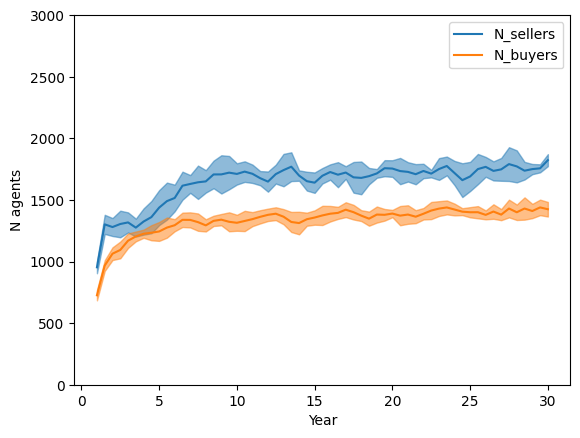

In [4]:
%matplotlib inline
model_df_mean = model_df.groupby(["Year"])[["N_sellers", "N_buyers"]].mean()
model_df_std = model_df.groupby(["Year"])[["N_sellers", "N_buyers"]].std()

model_df_mean = model_df_mean[1:]
model_df_std = model_df_std[1:]

# legendHandles replaced with legend_handles.
model_df_mean.plot()
for i, group in enumerate(["N_sellers", "N_buyers"]):
    plt.fill_between(model_df_mean.index,
                     (model_df_mean - model_df_std)[group],
                     (model_df_mean + model_df_std)[group],
                     color=plt.legend().legend_handles[i].get_color(),
                     alpha=0.5)

plt.ylabel("N agents")
plt.ylim(0, 3000)
plt.show()

### Prices, incomes, transactions per flood zone

In [5]:
# Read spatial data
spatial_df = gpd.read_file(parcel_file_shp)

spatial_df.columns

Index(['ID', 'COORDS_X', 'COORDS_Y', 'AGE', 'ROOMS', 'HOUSESIZE', 'LOTSIZE',
       'INQUALITY', 'PARKING', 'DISTAMEN', 'DISTCBD', 'PROXAMEN', 'DFLOOD100',
       'TRPRICE', 'YEAR', 'ASKPRICE', 'AGE2', 'HOUSESIZE2', 'LOTSIZE2',
       'LN_DISTCBD', 'LN_DISTAME', 'geometry'],
      dtype='object')

In [6]:
# rename ID column and set index
spatial_df = spatial_df.rename(columns={"ID": "Property ID"}).set_index("Property ID")

# Redo original preprocessing for relevant parcel attributes
spatial_df.loc[spatial_df["DFLOOD100"] == 1, "FLOOD_PROB"] = 0.01
spatial_df["FLOOD_PROB"] = spatial_df["FLOOD_PROB"].fillna(0)

spatial_df.head()

,COORDS_X,COORDS_Y,AGE,ROOMS,HOUSESIZE,LOTSIZE,INQUALITY,PARKING,DISTAMEN,DISTCBD,...,TRPRICE,YEAR,ASKPRICE,AGE2,HOUSESIZE2,LOTSIZE2,LN_DISTCBD,LN_DISTAME,geometry,FLOOD_PROB
Property ID,,,,,,,,,,,,,,,,,,,,,
7232060,175630,317736,100,6,117,35,4,0,1030,801,...,398000,2020,398000,10000,13689,1225,6.685861,6.937314,POINT (175630.000 317736.000),0.0
7108108,175795,317697,28,5,164,241,4,0,873,661,...,470000,2020,470000,784,26896,58081,6.493754,6.771935,POINT (175795.000 317697.000),0.0
7206606,178055,317761,90,7,152,119,4,0,1170,1676,...,469000,2020,469000,8100,23104,14161,7.424165,7.064759,POINT (178055.000 317761.000),0.0
7189060,174843,317719,58,7,124,313,4,1,1811,1572,...,349000,2020,349000,3364,15376,97969,7.360104,7.501635,POINT (174843.000 317719.000),0.0
7072257,173278,317266,21,5,95,130,4,0,3426,3196,...,225000,2020,225000,441,9025,16900,8.069655,8.139149,POINT (173278.000 317266.000),0.0


In [7]:
# define buyers and owners lists
buyers_df_list = []
owners_df_list = []

i = 0
for file in os.listdir(results_path):
    if file.startswith("agent") and file.endswith("pkl"):
        agent_df = pd.read_pickle(results_path + file)
        buyers_df = agent_df[(agent_df["Type"] == "Household") & (agent_df['Property ID'].isna())].copy()
        buyers_df["Run"] = int(file.split("seed")[1].split("]")[0])
        buyers_df_list.append(buyers_df)
        owners_df = agent_df[(agent_df["Type"] == "Household") & (~agent_df['Property ID'].isna())].copy()
        owners_df["Run"] = int(file.split("seed")[1].split("]")[0])
        owners_df_list.append(owners_df)
        i += 1

owners_df = pd.concat(owners_df_list)
owners_df = owners_df.reset_index().set_index("Property ID")
owners_df["FLOOD_PROB"] = spatial_df["FLOOD_PROB"]
owners_df["Year"] = 0.5 * owners_df["Step"]
owners_df["geometry"] = spatial_df["geometry"]
owners_df = gpd.GeoDataFrame(owners_df)
owners_df = owners_df.reset_index().set_index(["Year", "Run", "FLOOD_PROB"])

buyers_df = pd.concat(buyers_df_list).reset_index()
buyers_df["Year"] = 0.5 * buyers_df["Step"]
buyers_df = buyers_df.set_index(["Year", "Run"])

owners_df

Property ID  Step  AgentID       Type Market status  \
Year Run FLOOD_PROB                                                        
0.0  0   0.0           2206321.0     0      459  Household      Inactive   
         0.0           1340982.0     0     1192  Household      Inactive   
         0.0            625036.0     0     1193  Household      Inactive   
         0.0           6429727.0     0     1194  Household      Inactive   
         0.0           6632897.0     0     1195  Household      Inactive   
...                          ...   ...      ...        ...           ...   
30.0 3   0.0           2873016.0    60    40156  Household      Inactive   
         0.0            325382.0    60    40161  Household      Inactive   
         0.0           3429313.0    60    40162  Household      Inactive   
         0.0           5024780.0    60    40175  Household      Inactive   
         0.0           3861165.0    60    40176  Household      Inactive   

                            Income  Property price  Property N sales  \
Year Run FLOOD_PROB                                                    
0.0  0   0.0           8658.531976    76930.000000               0.0   
         0.0          27544.639468   190579.000000               0.0   
         0.0          27409.868949   206383.000000               0.0   
         0.0          27691.429884   197486.000000               0.0   
         0.0          27614.172239   226845.000000               0.0   
...                            ...             ...               ...   
30.0 3   0.0          67807.007276   247104.000000               6.0   
         0.0          11052.658271    90100.000000               6.0   
         0.0          11032.208704    80300.000000              10.0   
         0.0         156401.995949   189865.032493               5.0   
         0.0         156659.116422   175832.437385               7.0   

                     Coastal pref  RP bias                       geometry  
Year Run FLOOD_PROB                                                        
0.0  0   0.0             0.509039      0.0  POINT (177809.000 317303.000)  
         0.0             0.528767      0.0  POINT (174204.000 317143.000)  
         0.0             0.559687      0.0  POINT (177783.000 314966.000)  
         0.0             0.424186      0.0  POINT (178614.000 315675.000)  
         0.0             0.452228      0.0  POINT (179471.000 319146.000)  
...                           ...      ...                            ...  
30.0 3   0.0             0.539941      0.0  POINT (177096.000 317927.000)  
         0.0             0.450075      0.0  POINT (174368.000 317532.000)  
         0.0             0.444314      0.0  POINT (179151.000 319332.000)  
         0.0             0.469465      0.0  POINT (176531.000 316504.000)  
         0.0             0.488248      0.0  POINT (175900.000 316600.000)  

[1816885 rows x 11 columns]

#### Household incomes

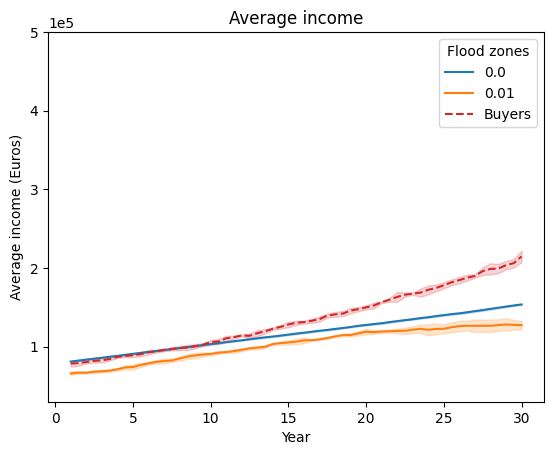

In [8]:
# Buyers income
buyers_mean = buyers_df[["Income"]].groupby(["Year", "Run"]).mean().groupby("Year").mean()
buyers_std = buyers_df[["Income"]].groupby(["Year", "Run"]).mean().groupby("Year").std()

# Owners income per flood zone
owners_mean = owners_df[["Income"]].groupby(["Year", "Run", "FLOOD_PROB"]).mean()["Income"].groupby(["Year", "FLOOD_PROB"]).mean().unstack()
owners_std = owners_df[["Income"]].groupby(["Year", "Run", "FLOOD_PROB"]).mean()["Income"].groupby(["Year", "FLOOD_PROB"]).std().unstack()

# Do not plot first timestep
owners_mean = owners_mean.loc[1:]
owners_std = owners_std.loc[1:]
buyers_mean = buyers_mean[1:]
buyers_std = buyers_std[1:]

# Plot average incomes + std
fig, ax = plt.subplots()
owners_mean.plot(ax=ax)
for i, prob in enumerate([0, 0.01]):
    ax.fill_between(owners_mean.index,
                    owners_mean[prob] - owners_std[prob],
                    owners_mean[prob] + owners_std[prob],
                    alpha=0.2, color=plt.legend().legend_handles[i].get_color())

ax.plot(buyers_mean, label="Buyers", color="tab:red", ls="--")
ax.fill_between(buyers_mean.index,
                (buyers_mean - buyers_std).values.flatten(),
                (buyers_mean + buyers_std).values.flatten(),
                alpha=0.2, color="tab:red")

plt.ticklabel_format(axis='y', scilimits=(0, 0))
plt.ylim(30000, 500000)
plt.ylabel("Average income (Euros)")
plt.title("Average income")
plt.legend(title="Flood zones")
plt.show()

#### Property prices

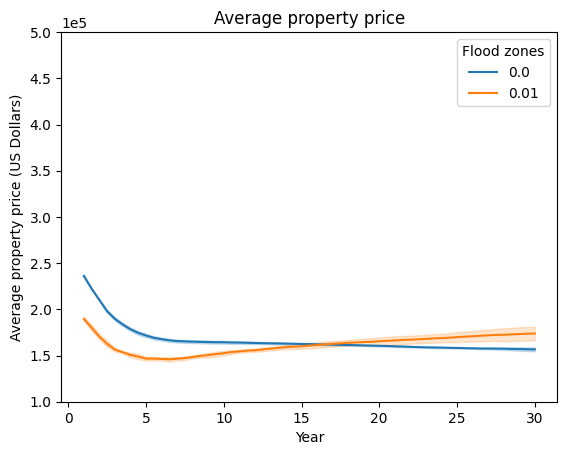

In [9]:
%matplotlib inline
# Average property prices
owners_mean = owners_df[["Property price"]].groupby(["Year", "Run", "FLOOD_PROB"]).mean()["Property price"].groupby(["Year", "FLOOD_PROB"]).mean().unstack()
owners_std = owners_df[["Property price"]].groupby(["Year", "Run", "FLOOD_PROB"]).mean()["Property price"].groupby(["Year", "FLOOD_PROB"]).std().unstack()

owners_mean = owners_mean[1:]
owners_std = owners_std[1:]

fig, ax = plt.subplots()
owners_mean.plot(ax=ax)
for i, prob in enumerate([0, 0.01]):
    ax.fill_between(owners_mean.index,
                    owners_mean[prob] - owners_std[prob],
                    owners_mean[prob] + owners_std[prob],
                    alpha=0.2, color=plt.legend().legend_handles[i].get_color())

plt.ticklabel_format(axis='y', scilimits=(0, 0))
plt.ylim(1e5, 5e5)
plt.ylabel("Average property price (US Dollars)")
plt.title("Average property price")
plt.legend(title="Flood zones")
plt.show()

#### Income/price ratio (compare runs)

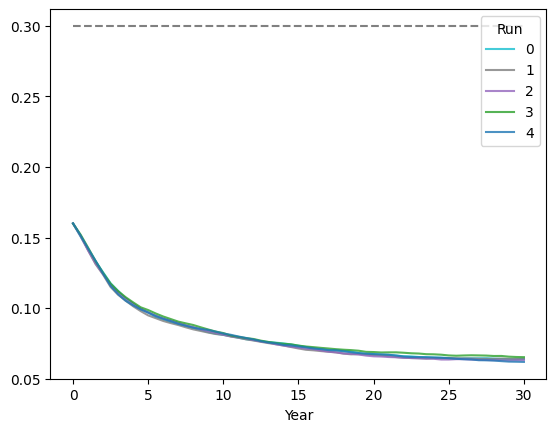

In [10]:
# Get ratio of property price / income / 30 (years mortgage).
# The resulting number is related to the maximum 30% of income spent on housing
# rule as described in Filatova (2015). The grey line indicated this maximum value.
ratio_df = owners_df[["Income", "Property price"]].copy()
ratio_df["Income price ratio"] = ratio_df["Property price"]/ratio_df["Income"]/30
ratio_df = ratio_df.groupby(["Year", "Run"]).mean()["Income price ratio"].unstack()
ratio_df.plot(cmap="tab10_r", alpha=0.8)
plt.hlines(0.3, min(ratio_df.index), max(ratio_df.index),
           color="grey", linestyle="--")
plt.show()

#### Income/price ratio (average over runs, per flood zone)

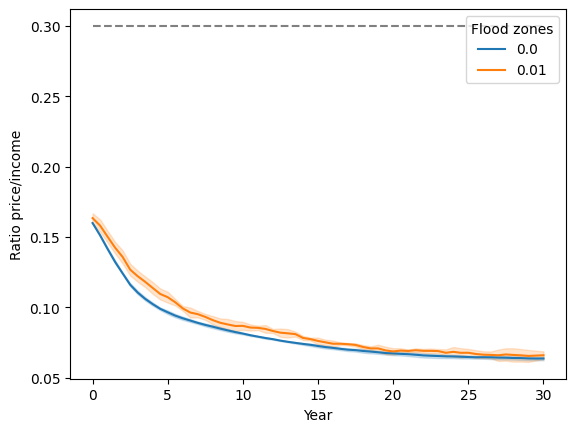

In [11]:
# Owners income per flood zone
owners_df["Income price ratio"] = owners_df["Property price"]/owners_df["Income"]/30
owners_mean = owners_df[["Income price ratio"]].groupby(["Year", "Run", "FLOOD_PROB"]).mean()["Income price ratio"].groupby(["Year", "FLOOD_PROB"]).mean().unstack()
owners_std = owners_df[["Income price ratio"]].groupby(["Year", "Run", "FLOOD_PROB"]).mean()["Income price ratio"].groupby(["Year", "FLOOD_PROB"]).std().unstack()

# Plot average incomes + std
fig, ax = plt.subplots()
owners_mean.plot(ax=ax)
for i, prob in enumerate([0, 0.01]):
    ax.fill_between(owners_mean.index,
                    owners_mean[prob] - owners_std[prob],
                    owners_mean[prob] + owners_std[prob],
                    alpha=0.2, color=plt.legend().legend_handles[i].get_color())

plt.hlines(0.3, min(ratio_df.index), max(ratio_df.index),
           color="grey", linestyle="--")
plt.ylabel("Ratio price/income")
plt.legend(title="Flood zones")
plt.show()

#### Transactions per zone

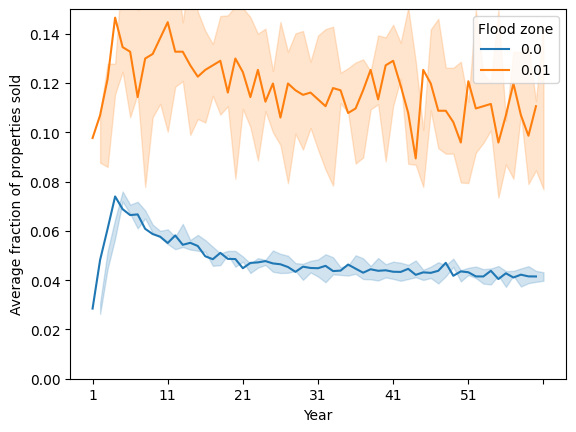

In [31]:
# Load transactions and order per run per property
trans_per_flood_df = model_df[["Sold properties", "P_ask", "P_bid", "P_trans", "Run"]].copy()
trans_per_flood_df = trans_per_flood_df.drop(0)
trans_per_flood_df.index.rename("Year", inplace=True)
trans_per_flood_df.index = trans_per_flood_df.index
trans_per_flood_df = trans_per_flood_df.set_index("Run", append=True)
trans_per_flood_df = trans_per_flood_df.explode(["Sold properties", "P_ask", "P_bid", "P_trans"])
trans_per_flood_df = trans_per_flood_df.reset_index().set_index(["Run", "Sold properties"])

trans_per_flood_df = pd.get_dummies(trans_per_flood_df["Year"])
trans_per_flood_df = trans_per_flood_df.groupby(["Run", "Sold properties"]).sum()
trans_per_flood_df = trans_per_flood_df.reset_index().set_index(["Sold properties"])
trans_per_flood_df = trans_per_flood_df.merge(spatial_df[["FLOOD_PROB"]], left_index=True, right_index=True)
trans_per_flood_df = trans_per_flood_df.groupby(["FLOOD_PROB", "Run"]).sum()
trans_per_flood_df = trans_per_flood_df.transpose()
trans_per_flood_df[0.01] = trans_per_flood_df[0.01]/217
trans_per_flood_df[0] = trans_per_flood_df[0]/5740

# Get mean and std over runs
trans_per_flood_df_mean = trans_per_flood_df.transpose().groupby("FLOOD_PROB").mean()
trans_per_flood_df_std = trans_per_flood_df.transpose().groupby("FLOOD_PROB").std()
trans_per_flood_df_std

trans_per_flood_df_mean.transpose().plot()
for i, prob in enumerate([0, 0.01]):
    plt.fill_between(list(trans_per_flood_df_mean.columns.values),
                     trans_per_flood_df_mean.loc[prob] - trans_per_flood_df_std.loc[prob],
                     trans_per_flood_df_mean.loc[prob] + trans_per_flood_df_std.loc[prob],
                     alpha=0.2, color=plt.legend().legend_handles[i].get_color())

plt.ylim(0, 0.15)
plt.xlabel("Year")
plt.ylabel("Average fraction of properties sold")
plt.legend(title="Flood zone")
plt.show()

## Price estimation: fitting regression or kriging model

#### Regression coefficients

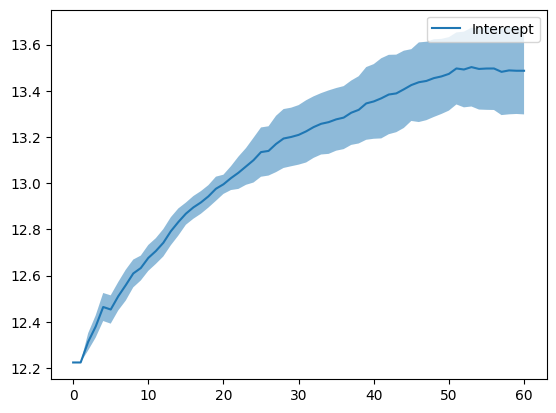

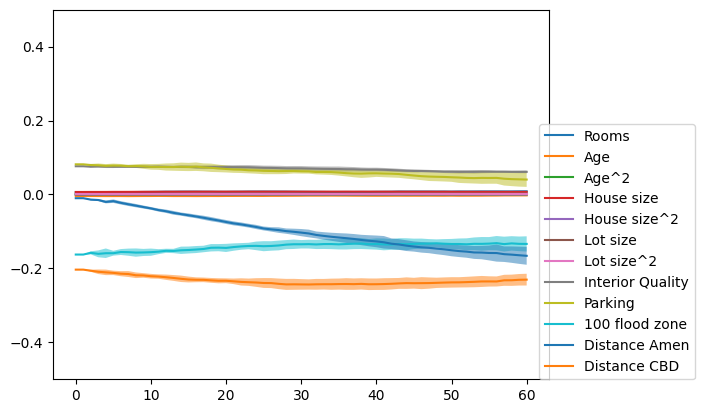

In [13]:
%matplotlib inline
coefs_avg = model_df["Regression coefs"].groupby(model_df["Step"]).mean()
coefs_std = model_df[["Regression coefs"]].stack().groupby(level=0).apply(lambda x:
                                                                          np.round(np.array(x).std(), 4))

coefs_avg = pd.DataFrame(coefs_avg.values.tolist())
coefs_std = pd.DataFrame(coefs_std.values.tolist())

coefs_avg[0].plot(label="Intercept")
plt.fill_between(coefs_avg.index,
                 coefs_avg[0] - coefs_std[0],
                 coefs_avg[0] + coefs_std[0],
                 alpha=0.5)
#plt.ylim(10, 14)
plt.legend()
plt.show()

plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab10.colors)
if "Results/Kriging" in results_path:
    labels = ["Age", "House size", "Lot size", "N bedrooms", "Flood zone"]
else:
    labels = ["Rooms",
              "Age", "Age^2",
              "House size", "House size^2",
              "Lot size", "Lot size^2",
              "Interior Quality", "Parking", "100 flood zone",
              "Distance Amen", "Distance CBD"
             ]
coefs_avg = coefs_avg.drop(columns=0)
coefs_std = coefs_std.drop(columns=0)
for coef in coefs_avg.columns:
    plt.plot(coefs_avg[coef], label=labels[coef-1])
for coef in coefs_avg.columns:
    plt.fill_between(coefs_avg.index,
                     coefs_avg[coef] - coefs_std[coef],
                     coefs_avg[coef] + coefs_std[coef],
                     alpha=0.5)
plt.ylim(-0.5, 0.5)
plt.legend(loc=(0.98, 0))
plt.show()

#### Number of historical transactions needed to fit model


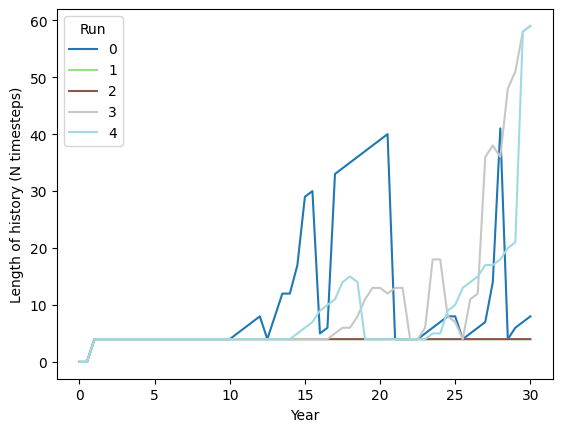

In [14]:
%matplotlib inline

trans_history = model_df.groupby(["Year", "Run"])["Trans history"].mean().unstack()
trans_history.plot(cmap="tab20")
plt.ylabel("Length of history (N timesteps)")
plt.show()

## Spatial plots


#### Variables per agent/property

In [15]:
property_df_list = []
i = 0
for file in os.listdir(results_path):
    if file.startswith("agent") and file.endswith("pkl"):
        agent_df = pd.read_pickle(results_path + file)
        property_df = agent_df[(agent_df["Type"] == "Household") & (~agent_df['Property ID'].isna())].copy()
        property_df["Run"] = int(file.split("seed")[1].split("]")[0])
        property_df_list.append(property_df)
        i += 1

# Add flood zones
property_df = pd.concat(property_df_list)
property_df = property_df.reset_index().set_index("Property ID")
property_df["FLOOD_PROB"] = spatial_df["FLOOD_PROB"]
property_df["Year"] = 0.5 * property_df["Step"]
property_df["geometry"] = spatial_df["geometry"]
property_df = gpd.GeoDataFrame(property_df)
property_df = property_df.reset_index().set_index(["Run", "Step", "Property ID"])
#property_df[(property_df["Run"] == 0) & (property_df["AgentID"] == 1617)]

In [16]:
# Add price changes per property
price_gradients = property_df.sort_values(["Run", "Property ID"])["Property price"].diff()
property_df["Price change"] = price_gradients.values
property_df = property_df.reset_index().set_index("Property ID")
property_df.loc[property_df["Step"] == 0, ["Price change"]] = 0
#property_df[(property_df["Run"] == 0) & (property_df["AgentID"] == 1617)]

In [17]:
# Add cumulative price changes
property_df = property_df.sort_values(["Run", "Property ID"])
prices = property_df.groupby(["Run", "Property ID"])["Price change"]
property_df["Cumulative price change"] = prices.cumsum()
property_df = property_df.reset_index().set_index("Property ID")
#property_df[(property_df["Run"] == 0) & (property_df["AgentID"] == 1617)]

In [18]:
# NL data 
path = '/Users/aslimutlu/Desktop/P2_model/Data/NL/'

# Administrative (city borders) of Maastricht
M_adm_shp = "Maastricht_adm.shp"

# Total inundated area in 1993-1995 in Maastricht
M_inundated_shp = "Total_inundation_Maastricht_dissolved.shp"

# Meuse River in Maastricht
M_Meuse_shp = "Meuse_Maastricht.shp"

# Neighborhood characteristics of Maastricht. Source: CBS (2013)
M_neighborhood_shp = "Maastricht_neighborhoods_cbs.shp"

# Parcel (pand) characteristics of Maastricht. Source: CBS (2013)
M_parcel_shp = "Maastricht_pand_cbs.shp"

# Inundated houses in 1993-1995 in Maastricht
M_inundated_prop_shp = "Maastricht_inundated_clipped.shp"

In [19]:
# Load spatial datasets
adm_gdf = gpd.read_file(path+M_adm_shp)
adm_gdf = adm_gdf.to_crs('epsg:3857')

inundated_gdf = gpd.read_file(path+M_inundated_shp)
inundated_gdf = inundated_gdf.to_crs('epsg:3857')

meuse_gdf = gpd.read_file(path+M_Meuse_shp)
meuse_gdf = meuse_gdf.to_crs('epsg:3857')

neighborhood_gdf = gpd.read_file(path+M_neighborhood_shp)
neighborhood_gdf = neighborhood_gdf.to_crs('epsg:3857')

parcel_gdf = gpd.read_file(path+M_parcel_shp)
parcel_gdf = parcel_gdf.to_crs('epsg:3857')

inundated_prop_gdf = gpd.read_file(path+M_inundated_prop_shp)
inundated_prop_gdf = inundated_prop_gdf.to_crs('epsg:3857')

spatial_df = spatial_df.to_crs('epsg:3857')


(626172.1357121639, 645740.0149531689, 6584591.364598221, 6609051.213649478)

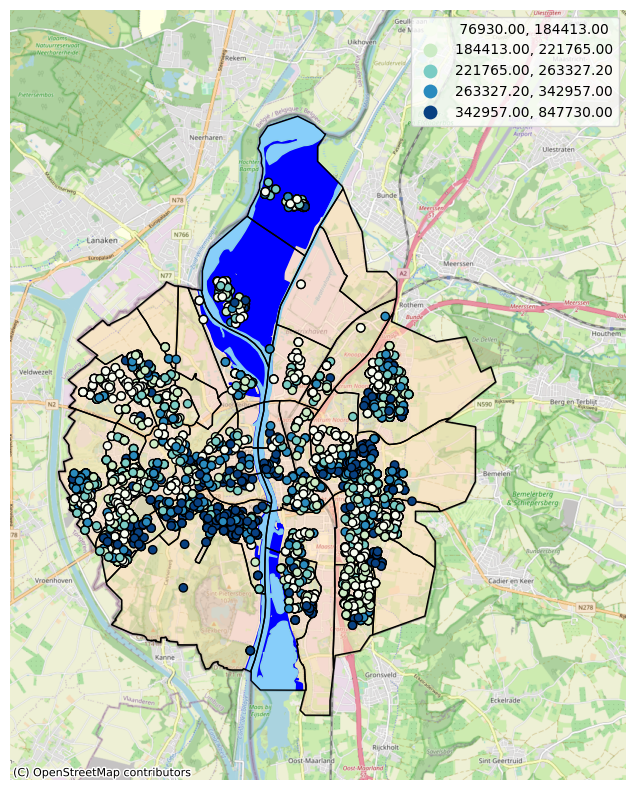

In [20]:
# Plot the datasets. Change the column name based on what you want to map
fig, ax = plt.subplots(figsize=(12,10), subplot_kw={'aspect':'equal'})
base = Place("Maastricht", source=cx.providers.OpenStreetMap.Mapnik)
base.plot(ax=ax)
adm_gdf.plot(facecolor="peachpuff", edgecolor="black",legend=True, ax=ax, alpha = 0.5)
inundated_gdf.plot(facecolor="blue", edgecolor="blue",legend=True, ax=ax)
meuse_gdf.plot(facecolor="lightskyblue", edgecolor="skyblue",legend=True, ax=ax)
#parcel_gdf.plot(column='S_m_residential', cmap='GnBu', legend=True, ax=ax)
neighborhood_gdf.plot(facecolor="none", edgecolor="black",legend=True, ax=ax)
spatial_df.plot(column='TRPRICE', scheme='Quantiles', k=5, cmap='GnBu', edgecolor="black", legend=True, ax=ax)
#inundated_prop_gdf.plot(facecolor="orange", edgecolor="black",legend=False, ax=ax)
#ctx.add_basemap(ax, crs= adm_gdf.crs, source=ctx.providers.CartoDB.Voyager) -- doesn't work
# fig, ax = plt.subplots(figsize=(20,20))
# base = Place("Maastricht", source=cx.providers.OpenStreetMap.Mapnik)
# base.plot(ax=ax)
ax.axis("off")

In [21]:
def plot_maastricht(variable, year, logscale=False, divergent=False, classes = False, save=False):
    fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
    ax.axis("off")
    
# #     # Plot basemap
    base.plot(ax=ax)
    # Plot administrative borders
    adm_gdf.plot(ax=ax, facecolor="peachpuff", edgecolor="black",legend=True, alpha = 0.5)
    # Plot inundated areas in 1993-1995 floods
    inundated_gdf.plot(ax=ax, facecolor="blue", edgecolor="blue",legend=True)
    # Plot the Meuse River
    meuse_gdf.plot(ax=ax, facecolor="lightskyblue", edgecolor="skyblue",legend=True)
    # Plot neighborhood borders
    neighborhood_gdf.plot(ax=ax, facecolor="none", edgecolor="black",legend=True)
    

    # Plot variable of interest (averaged over runs)
    geometry = property_df[(property_df["Run"] == 0) & (property_df["Year"] == year)]["geometry"]
    df = gpd.GeoDataFrame(property_df[property_df["Year"] == year].groupby(["Property ID"])[[variable]].mean(), geometry=geometry)
    df = df.to_crs('epsg:3857')
#     df = gpd.GeoDataFrame(property_df[property_df["Year"] == year].groupby(["Property ID"])[[variable]].mean())
#     df["geometry"] = property_df[(property_df["Run"] == 0) & (property_df["Year"] == year)]["geometry"]
    if logscale:
        df.plot(variable, ax=ax,
                cmap="YlGn", edgecolor="black",
                legend=True, legend_kwds={"shrink": 0.3, "label": variable},
                norm=colors.LogNorm(vmin=1e5, vmax=1e7)
                )
    elif divergent:
        df.plot(variable, ax=ax,
                cmap="RdYlGn", edgecolor="black",
                legend=True, legend_kwds={"shrink": 0.3, "label": variable},
#                 norm=colors.TwoSlopeNorm(vmin=df[variable].min(), vcenter=0, vmax=df[variable].max()),
                vmin=-1e6,
                vmax=1e6
               )
    elif classes:
        df.plot(variable, ax=ax, scheme='Quantiles', k=5,
                cmap="GnBu", edgecolor="black",
                legend=True,
#                 norm=colors.TwoSlopeNorm(vmin=df[variable].min(), vcenter=0, vmax=df[variable].max()),
               )
    else:
        df.plot(variable, ax=ax,
                cmap="YlGn", edgecolor="black",
                legend=True, legend_kwds={"shrink": 0.3, "label": variable},
                vmin=1e2,
                vmax=1e5
               )
#column='TRPRICE', scheme='Quantiles', k=5, cmap='GnBu', edgecolor="black", legend=True, ax=ax
        
    # Plot settings
    for ax in fig.axes:
        ax.tick_params(labelsize=8)
    plt.tight_layout()
    if save:
        plt.savefig("Figures/temp/Beaufort_" + variable + "_T" + str(year) + ".png",
                    dpi=300)
        plt.close()
    else:
        plt.show()

### Cumulative price changes

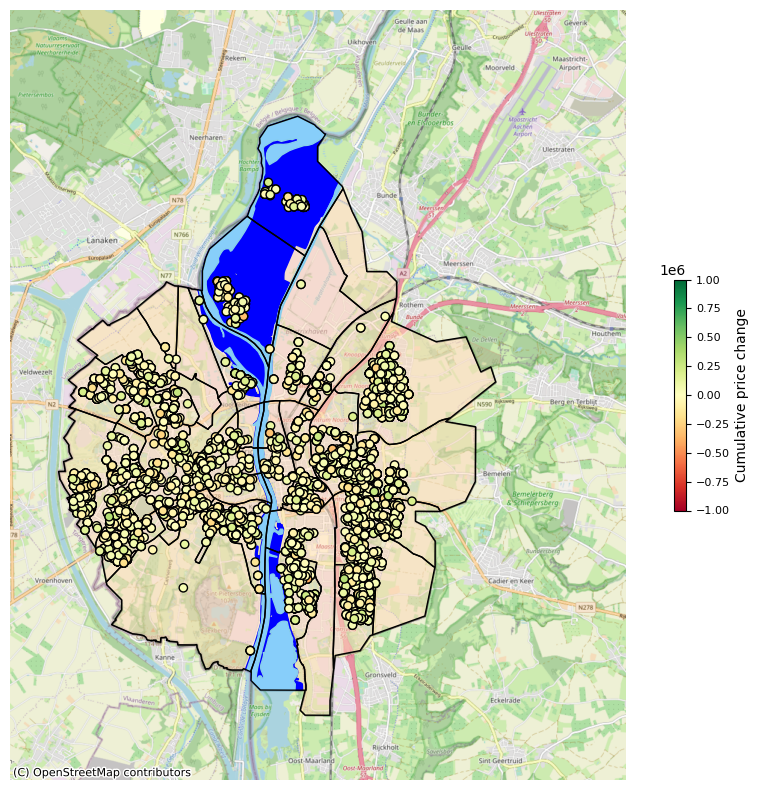

In [22]:
%matplotlib inline
plot_maastricht(variable="Cumulative price change", year=30, divergent=True)

### Household Income

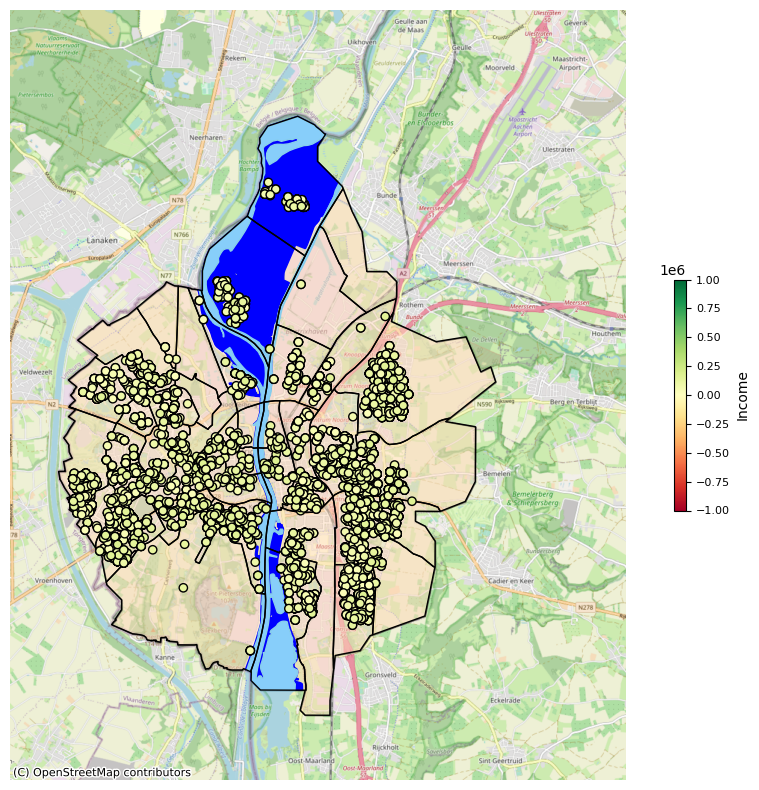

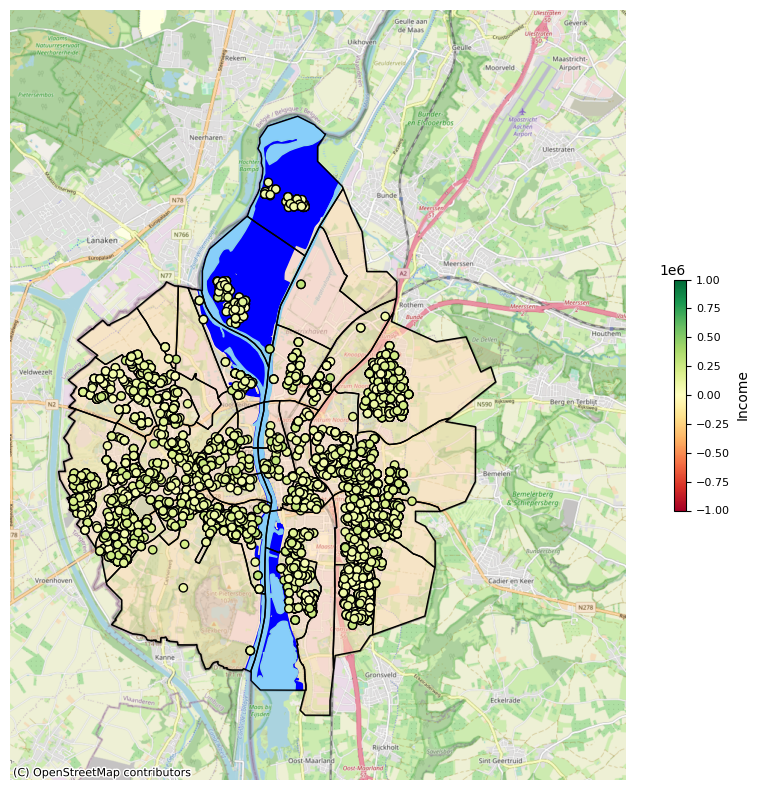

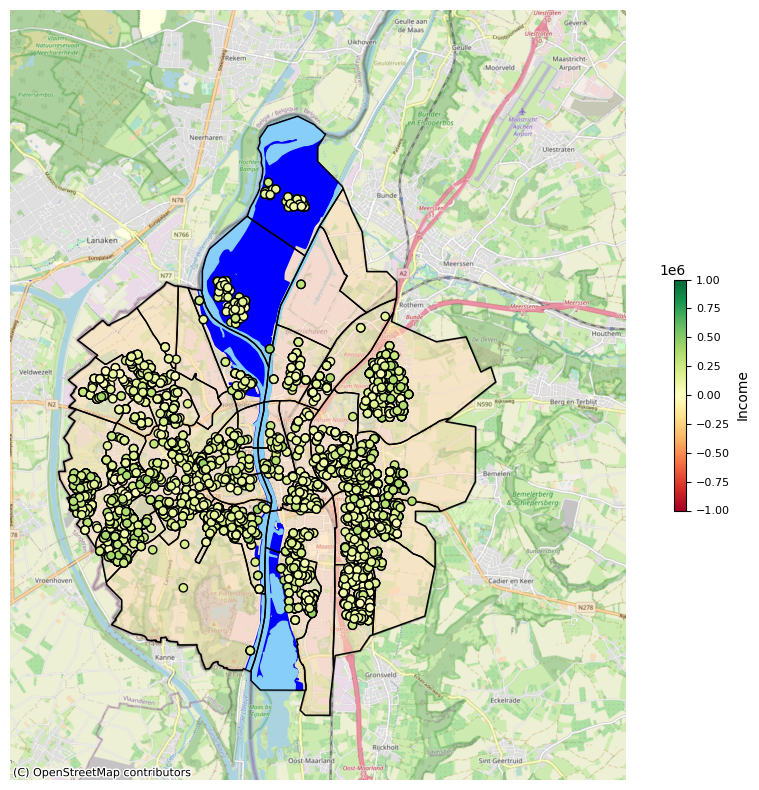

In [23]:
%matplotlib inline
plot_maastricht(variable="Income", year=1, divergent=True)
plot_maastricht(variable="Income", year=15, divergent=True)
plot_maastricht(variable="Income", year=30, divergent=True)

In [24]:
# Use this code to save figures at specified interval (used for creating GIFs/animated plots)

# %matplotlib inline
# for year in np.arange(0.5, 10, 1):
#     plot_maastricht(variable="Income", year=year, logscale=False, save=True)

### House Prices

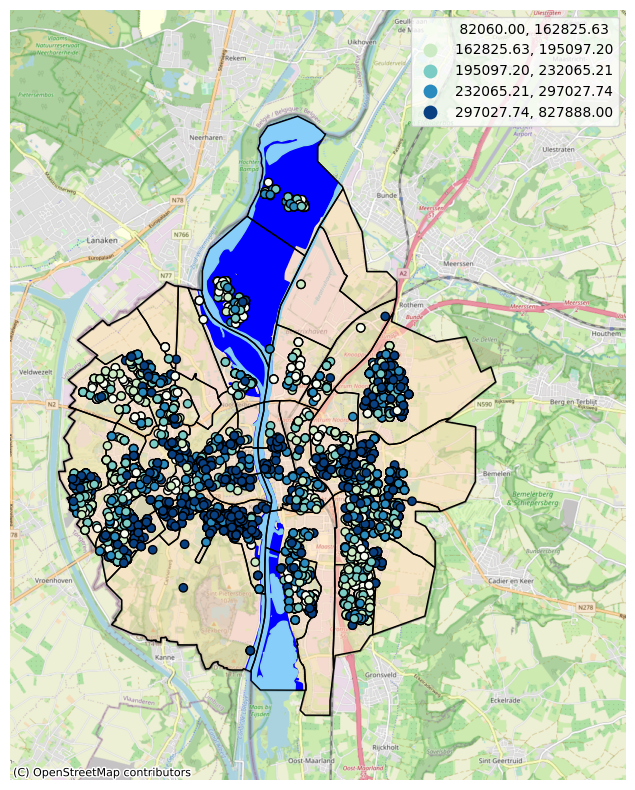

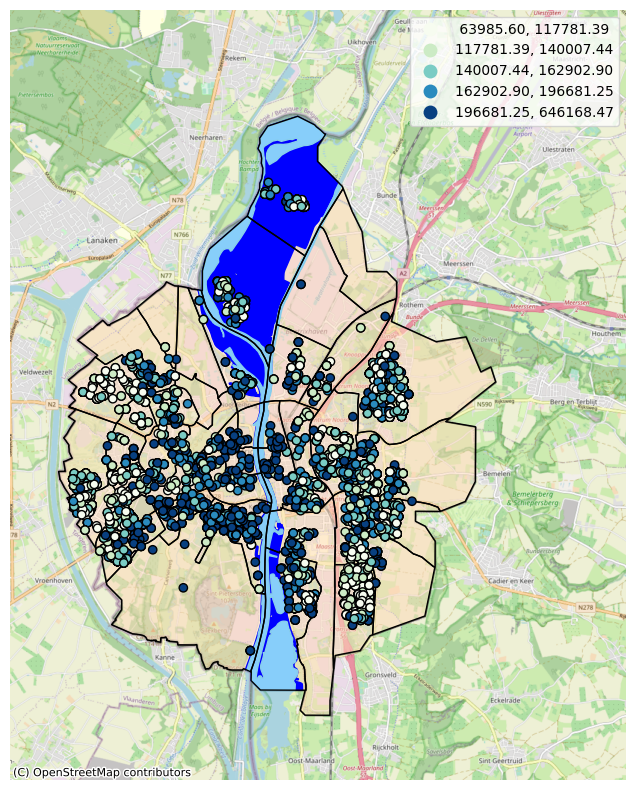

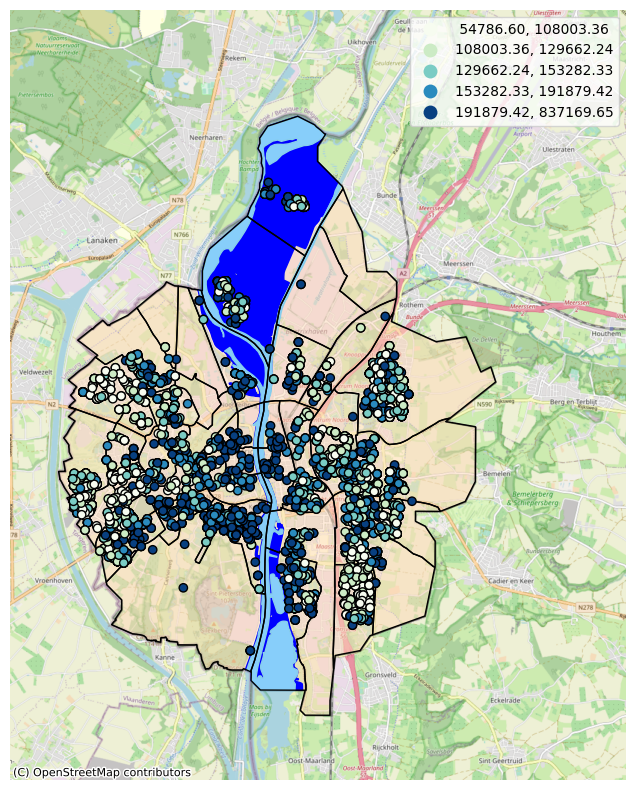

In [25]:
%matplotlib inline
plot_maastricht(variable="Property price", year=1, classes=True)
plot_maastricht(variable="Property price", year=15, classes=True)
plot_maastricht(variable="Property price", year=30, classes=True)